# **MACHINE LEARNING PROJECT: OMS INSIGHTS INTO MENTAL HEALTH CHALLENGES IN THE POPULATION**

 [Click to check this project online ](https://vscode.dev/https://github.com/enriquerc95/MACHINE_LEARNING_PROJECT/blob/main/src/results_notebook/ML_Project.ipynb)
 


1. [Background](#1.Background)

2. [Machine learning toolbox setup](#2.Machine-learning-toolbox-setup)

3. [Cleaning data](#Cleaning-data)

    -[Convert Categorical Variables to Numerical](#Convert-Categorical-Variables-to-Numerical)
    
    -[Drop categorical columns](#Drop-categorical-columns)

    -[NaN Treatment](#NaN-Treatment)
    
4. [Mini EDA](#Mini-EDA)

    -[Train test split](#Train-test-split)

    -[Features distribution](#Features-distribution)

5. [Models](#Models)

   -[Cross validation](#Cross-validation)
   
   -[Random Forest](#Random-Forest)

   -[LGBM and XGBR regressor](#LGBM-and-XGBR-regressor)

   -[Comparation](#Compare-our-best-models)

6. [Are socioeconomic factors the main causes of suicide?](#Identify-whether-the-most-important-risk-factors-associated-with-high-suicide-rates-in-each-country-are-socioeconomic.)

7. [Countries with the highest suicide rates](#Rank-countries-according-to-their-perceived-need-for-mental-health-and-suicide-prevention-intervention-and-resources.)



 




## **1.Background** 


The World Health Organization (WHO) and the United Nations are concerned by the rising suicide rates worldwide, and they want to implemet effective measures to reduce these numbers. To treat this challenge, they want to develop a machine learning model that can identify wich countries needs more resources in terms of mental health and suicide porevention.

### What is our objective?

* Business problem:
 Could we create a model to predict the suicide rates per 100.000 habitants in a selected country using demographic, economic and mental health characteristics, such as age, sex, GDP per capita, gross national income per capita, inflation rate, and proportion of labor force employed?

* Identify whether the most important risk factors associated with high suicide rates in each country are socioeconomic.

* Rank countries according to their perceived need for mental health and suicide prevention intervention and resources.


### Data description

* **RegionCode:** Represents the continent code to which the country belongs.

* **RegionName:** Indicates the name of the continent to which the country belongs.

* **CountryCode:** This field provides the unique code assigned to each country.

* **CountryName:** Specifies the name of the country to which the data belongs.

* **Year:** Indicates the year to which the data corresponds.

* **Sex:** Indicates the gender of the subject.

* **AgeGroup:** Categorizes individuals into specific age ranges.

* **Generation:** Provides information about the generation to which the individuals under study belong. For example, "Baby Boomers," "Generation X," "Millennials," etc.

* **SuicideCount:** Indicates the total number of reported suicides. It is a direct measure of the number of recorded suicides.

* **CauseSpecificDeathPercentage:** This field represents the percentage of deaths specifically caused by suicide relative to the total deaths in the population. It provides a measure of the prevalence of suicides compared to other causes of death.

* **DeathRatePer100K:** Indicates the suicide rate per 100,000 inhabitants in the population under study.

* **Population:** Represents the total population in the specific category provided in the dataset.

* **GDP:** Indicates the Gross Domestic Product (GDP) of the country in the corresponding year. GDP is a measure of the economic value of all goods and services produced in a country during a specific period.

* **GDPPerCapita:** Represents the GDP per capita, which is the total GDP divided by the total population of the country in the corresponding year. It provides a measure of the average income per person in the country.

* **GrossNationalIncome:** Indicates the Gross National Income (GNI) of the country in the corresponding year. GNI is similar to GDP but also includes net income from abroad.

* **GNIPerCapita:** Represents the Gross National Income (GNI) per capita, which is the total GNI divided by the total population of the country in the corresponding year. It provides a measure of the average income per person in the country, including income from abroad.

* **InflationRate:** This field indicates the annual inflation rate of the country in the corresponding year. The inflation rate represents the percentage change in the price level of goods and services in a country during a specific period.

* **EmploymentPopulationRatio:** Represents the proportion of the employed working-age population (employment) relative to the total population of working age (usually between 15 and 64 years) in the country in the corresponding year.







************************

## **2. Machine learning toolbox setup**

In [205]:
import joblib
import pandas as pd
import ML_ToolBox as tb
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import bootcampviztools as bt

from catboost import CatBoostClassifier,CatBoostRegressor
from lightgbm import LGBMRegressor
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.linear_model import LinearRegression, ridge_regression, Ridge, Lasso
from sklearn.metrics import classification_report, mean_squared_error, r2_score, mean_absolute_error, mean_absolute_percentage_error
from sklearn.model_selection import cross_val_score, train_test_split, GridSearchCV
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from xgboost import XGBClassifier, XGBRegressor


## **3. Cleaning data**

### Could we create a model to predict the suicide rates per 100.000 habitants in a selected country using demographic, economic and mental health characteristics, such as age, sex, GDP per capita, gross national income per capita, inflation rate, and proportion of labor force employed?

#### Import suicide rates dataset

In [206]:
suicide = pd.read_csv("data/suicide_rates_1990-2022.csv")

In [207]:
#data copy
df = suicide.copy()

In [208]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 118560 entries, 0 to 118559
Data columns (total 18 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   RegionCode                    118560 non-null  object 
 1   RegionName                    118560 non-null  object 
 2   CountryCode                   118560 non-null  object 
 3   CountryName                   118560 non-null  object 
 4   Year                          118560 non-null  int64  
 5   Sex                           118560 non-null  object 
 6   AgeGroup                      118560 non-null  object 
 7   Generation                    118560 non-null  object 
 8   SuicideCount                  118096 non-null  float64
 9   CauseSpecificDeathPercentage  114271 non-null  float64
 10  DeathRatePer100K              107896 non-null  float64
 11  Population                    112640 non-null  float64
 12  GDP                           111320 non-nul

In [209]:
df.head()

,RegionCode,RegionName,CountryCode,CountryName,Year,Sex,AgeGroup,Generation,SuicideCount,CauseSpecificDeathPercentage,DeathRatePer100K,Population,GDP,GDPPerCapita,GrossNationalIncome,GNIPerCapita,InflationRate,EmploymentPopulationRatio
0,EU,Europe,ALB,Albania,1992,Male,0-14 years,Generation Alpha,0.0,0.000000,0.000000,3247039.0,652174990.8,200.85222,906184212.3,1740.0,226.005421,45.315
1,EU,Europe,ALB,Albania,1992,Male,0-14 years,Generation Alpha,0.0,0.000000,0.000000,3247039.0,652174990.8,200.85222,906184212.3,1740.0,226.005421,45.315
2,EU,Europe,ALB,Albania,1992,Male,0-14 years,Generation Alpha,0.0,0.000000,0.000000,3247039.0,652174990.8,200.85222,906184212.3,1740.0,226.005421,45.315
3,EU,Europe,ALB,Albania,1992,Male,0-14 years,Generation Alpha,0.0,0.000000,0.000000,3247039.0,652174990.8,200.85222,906184212.3,1740.0,226.005421,45.315
4,EU,Europe,ALB,Albania,1992,Male,15-24 years,Generation Z,5.0,3.401361,3.531073,3247039.0,652174990.8,200.85222,906184212.3,1740.0,226.005421,45.315


In [210]:
#I get a look to this column because doesn´t make sense
df[df["Generation"] == "Generation Z"] 

,RegionCode,RegionName,CountryCode,CountryName,Year,Sex,AgeGroup,Generation,SuicideCount,CauseSpecificDeathPercentage,DeathRatePer100K,Population,GDP,GDPPerCapita,GrossNationalIncome,GNIPerCapita,InflationRate,EmploymentPopulationRatio
4,EU,Europe,ALB,Albania,1992,Male,15-24 years,Generation Z,5.0,3.401361,3.531073,3247039.0,6.521750e+08,200.852220,9.061842e+08,1740.0,226.005421,45.315
5,EU,Europe,ALB,Albania,1992,Male,15-24 years,Generation Z,4.0,1.904762,3.276003,3247039.0,6.521750e+08,200.852220,9.061842e+08,1740.0,226.005421,45.315
24,EU,Europe,ALB,Albania,1992,Female,15-24 years,Generation Z,4.0,6.896552,2.645503,3247039.0,6.521750e+08,200.852220,9.061842e+08,1740.0,226.005421,45.315
25,EU,Europe,ALB,Albania,1992,Female,15-24 years,Generation Z,3.0,3.529412,2.124646,3247039.0,6.521750e+08,200.852220,9.061842e+08,1740.0,226.005421,45.315
44,EU,Europe,ALB,Albania,1993,Male,15-24 years,Generation Z,10.0,7.142857,7.468260,3227287.0,1.185315e+09,367.279225,1.024263e+09,2110.0,85.004751,47.798
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
118505,AS,Asia,TKM,Turkmenistan,2008,Female,15-24 years,Generation Z,15.0,5.791506,5.894998,5100083.0,1.927152e+10,3778.668539,1.498748e+10,7850.0,NaN,47.919
118524,NAC,North America and the Caribbean,USA,United States of America,2021,Male,15-24 years,Generation Z,1780.0,18.342951,16.353550,332031554.0,2.331510e+13,70219.472450,2.370530e+13,71130.0,4.697859,57.946
118525,NAC,North America and the Caribbean,USA,United States of America,2021,Male,15-24 years,Generation Z,3463.0,19.020157,30.787570,332031554.0,2.331510e+13,70219.472450,2.370530e+13,71130.0,4.697859,57.946
118544,NAC,North America and the Caribbean,USA,United States of America,2021,Female,15-24 years,Generation Z,563.0,15.203889,5.382732,332031554.0,2.331510e+13,70219.472450,2.370530e+13,71130.0,4.697859,57.946


In [211]:
#Drop the columns that i dont need, because is the same as regioncode and countrycode. Generation dosen´t make sense.
df.drop(["RegionCode", "CountryCode", "Generation"], axis = 1, inplace=True)

In [212]:
#Drop duplicated rows
duplicated_rows = df[df.duplicated(keep=False)]

duplicated_rows 


,RegionName,CountryName,Year,Sex,AgeGroup,SuicideCount,CauseSpecificDeathPercentage,DeathRatePer100K,Population,GDP,GDPPerCapita,GrossNationalIncome,GNIPerCapita,InflationRate,EmploymentPopulationRatio
0,Europe,Albania,1992,Male,0-14 years,0.0,0.0,0.0,3247039.0,6.521750e+08,200.852220,9.061842e+08,1740.0,226.005421,45.315
1,Europe,Albania,1992,Male,0-14 years,0.0,0.0,0.0,3247039.0,6.521750e+08,200.852220,9.061842e+08,1740.0,226.005421,45.315
2,Europe,Albania,1992,Male,0-14 years,0.0,0.0,0.0,3247039.0,6.521750e+08,200.852220,9.061842e+08,1740.0,226.005421,45.315
3,Europe,Albania,1992,Male,0-14 years,0.0,0.0,0.0,3247039.0,6.521750e+08,200.852220,9.061842e+08,1740.0,226.005421,45.315
13,Europe,Albania,1992,Male,55-74 years,0.0,0.0,0.0,3247039.0,6.521750e+08,200.852220,9.061842e+08,1740.0,226.005421,45.315
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
118518,Asia,Turkmenistan,2008,Female,75+ years,0.0,0.0,0.0,5100083.0,1.927152e+10,3778.668539,1.498748e+10,7850.0,NaN,47.919
118520,North America and the Caribbean,United States of America,2021,Male,0-14 years,0.0,0.0,0.0,332031554.0,2.331510e+13,70219.472450,2.370530e+13,71130.0,4.697859,57.946
118521,North America and the Caribbean,United States of America,2021,Male,0-14 years,0.0,0.0,0.0,332031554.0,2.331510e+13,70219.472450,2.370530e+13,71130.0,4.697859,57.946
118540,North America and the Caribbean,United States of America,2021,Female,0-14 years,0.0,0.0,0.0,332031554.0,2.331510e+13,70219.472450,2.370530e+13,71130.0,4.697859,57.946


In [213]:
df.drop_duplicates(inplace = True)

### **Convert Categorical Variables to Numerical**

#### I do a mapping to change the columns to numeric

In [214]:


mapping_dict_1 = {'Europe': 1,
                  'Asia ': 2,
                  'Central and South America ': 3,
                  'North America and the Caribbean': 4,
                  'Africa': 5,
                  'Oceania': 6
                  }

mapping_dict_2 = {'Male': 1,
                  'Female': 2,
                  'Unknown': 3
                  }

mapping_dict_= {'0-14 years': 1,
                '15-24 years': 2,
                '25-34 years': 3,
                '35-54 years': 4,
                '55-74 years': 5,
                '75+ years': 6,
                'Unknown': 7
                           }

df['regionname_num'] = df['RegionName'].map(mapping_dict_1) 
df['sex_num'] = df['Sex'].map(mapping_dict_2)
df['agegroup_num'] = df['AgeGroup'].map(mapping_dict_3)


#### I do a list with all countries to put the number ISO

In [215]:
#I see how many countries have the data
unique_countries = df['CountryName'].unique().tolist()
print(unique_countries)


['Albania', 'Argentina', 'Armenia', 'Australia', 'Austria', 'Azerbaijan', 'Bahrain', 'Bahamas', 'Antigua and Barbuda', 'Barbados', 'Belarus', 'Belgium', 'Belize', 'Bosnia and Herzegovina', 'Brazil', 'Brunei Darussalam', 'Bulgaria', 'Cabo Verde', 'Canada', 'Chile', 'Colombia', 'Costa Rica', 'Croatia', 'Cuba', 'Cyprus', 'Czechia', 'Denmark', 'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt', 'El Salvador', 'Estonia', 'Fiji', 'Finland', 'France', 'French Guiana', 'Georgia', 'Germany', 'Greece', 'Grenada', 'Guadeloupe', 'Guatemala', 'Guyana', 'China, Hong Kong SAR', 'Hungary', 'Iceland', 'Iran (Islamic Republic of)', 'Iraq', 'Ireland', 'Israel', 'Italy', 'Jamaica', 'Japan', 'Kazakhstan', 'Republic of Korea', 'Kuwait', 'Kyrgyzstan', 'Latvia', 'Lithuania', 'Luxembourg', 'Maldives', 'Malta', 'Martinique', 'Mauritius', 'Mayotte', 'Mexico', 'Republic of Moldova', 'Montenegro', 'Netherlands', 'New Zealand', 'Nicaragua', 'North Macedonia', 'Norway', 'Panama', 'Paraguay', 'Peru', 'Philippines',

In [216]:
#I write the iso numbers for the new numeric column

mapping_dict_4 = {  
    'Albania': 8,
    'Argentina': 32,
    'Armenia': 51,
    'Australia': 36,
    'Austria': 40,
    'Azerbaijan': 31,
    'Bahrain': 48,
    'Bahamas': 44,
    'Antigua and Barbuda': 28,
    'Barbados': 52,
    'Belarus': 112,
    'Belgium': 56,
    'Belize': 84,
    'Bosnia and Herzegovina': 70,
    'Brazil': 76,
    'Brunei Darussalam': 96,
    'Bulgaria': 100,
    'Cabo Verde': 132,
    'Canada': 124,
    'Chile': 152,
    'Colombia': 170,
    'Costa Rica': 188,
    'Croatia': 191,
    'Cuba': 192,
    'Cyprus': 196,
    'Czechia': 203,
    'Denmark': 208,
    'Dominica': 212,
    'Dominican Republic': 214,
    'Ecuador': 218,
    'Egypt': 818,
    'El Salvador': 222,
    'Estonia': 233,
    'Fiji': 242,
    'Finland': 246,
    'France': 250,
    'French Guiana': 254,
    'Georgia': 268,
    'Germany': 276,
    'Greece': 300,
    'Grenada': 308,
    'Guadeloupe': 312,
    'Guatemala': 320,
    'Guyana': 328,
    'China, Hong Kong SAR': 344,
    'Hungary': 348,
    'Iceland': 352,
    'Iran (Islamic Republic of)': 364,
    'Iraq': 368,
    'Ireland': 372,
    'Israel': 376,
    'Italy': 380,
    'Jamaica': 388,
    'Japan': 392,
    'Kazakhstan': 398,
    'Republic of Korea': 410,
    'Kuwait': 414,
    'Kyrgyzstan': 417,
    'Latvia': 428,
    'Lithuania': 440,
    'Luxembourg': 442,
    'Maldives': 462,
    'Malta': 470,
    'Martinique': 474,
    'Mauritius': 480,
    'Mayotte': 175,
    'Mexico': 484,
    'Republic of Moldova': 498,
    'Montenegro': 499,
    'Netherlands': 528,
    'New Zealand': 554,
    'Nicaragua': 558,
    'North Macedonia': 807,
    'Norway': 578,
    'Panama': 591,
    'Paraguay': 600,
    'Peru': 604,
    'Philippines': 608,
    'Poland': 616,
    'Portugal': 620,
    'Puerto Rico': 630,
    'R?union': 638,
    'Romania': 642,
    'Russian Federation': 643,
    'Saint Kitts and Nevis': 659,
    'Saint Lucia': 662,
    'Saint Vincent and the Grenadines': 670,
    'Serbia': 688,
    'Seychelles': 690,
    'Singapore': 702,
    'Slovakia': 703,
    'Slovenia': 705,
    'South Africa': 710,
    'Spain': 724,
    'Sri Lanka': 144,
    'Suriname': 740,
    'Sweden': 752,
    'Switzerland': 756,
    'Syrian Arab Republic': 760,
    'Tajikistan': 762,
    'Thailand': 764,
    'Trinidad and Tobago': 780,
    'T?rkiye': 792,
    'Turkmenistan': 795,
    'Ukraine': 804,
    'United Kingdom of Great Britain and Northern Ireland': 826,
    'United States of America': 840,
    'Uruguay': 858,
    'Uzbekistan': 860,
    'Venezuela (Bolivarian Republic of)': 862,
    'Jordan': 400,
    'United Arab Emirates': 784,
    'Lebanon': 422,
    'Mongolia': 496,
    'Malaysia': 458,
    'Oman': 512,
    'Qatar': 634
}

#New numeric column
df['countryname_num'] = df['CountryName'].map(mapping_dict_4)

In [217]:
#check new columns
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 95976 entries, 0 to 118559
Data columns (total 19 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   RegionName                    95976 non-null  object 
 1   CountryName                   95976 non-null  object 
 2   Year                          95976 non-null  int64  
 3   Sex                           95976 non-null  object 
 4   AgeGroup                      95976 non-null  object 
 5   SuicideCount                  95684 non-null  float64
 6   CauseSpecificDeathPercentage  92095 non-null  float64
 7   DeathRatePer100K              87733 non-null  float64
 8   Population                    91487 non-null  float64
 9   GDP                           90301 non-null  float64
 10  GDPPerCapita                  90301 non-null  float64
 11  GrossNationalIncome           88007 non-null  float64
 12  GNIPerCapita                  87366 non-null  float64
 13  Infla

### Drop categorical columns

In [ ]:
cat_col = ['RegionName','CountryName','Sex', 'AgeGroup']
df.drop(columns = cat_col, axis = 1, inplace = True)

In [201]:
#check
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 95976 entries, 0 to 118559
Data columns (total 15 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Year                          95976 non-null  int64  
 1   SuicideCount                  95684 non-null  float64
 2   CauseSpecificDeathPercentage  92095 non-null  float64
 3   DeathRatePer100K              87733 non-null  float64
 4   Population                    91487 non-null  float64
 5   GDP                           90301 non-null  float64
 6   GDPPerCapita                  90301 non-null  float64
 7   GrossNationalIncome           88007 non-null  float64
 8   GNIPerCapita                  87366 non-null  float64
 9   InflationRate                 84214 non-null  float64
 10  EmploymentPopulationRatio     89097 non-null  float64
 11  regionname_num                57007 non-null  float64
 12  sex_num                       95976 non-null  int64  
 13  agegr

### NaN Treatment

In [202]:
#Check the columns that have NaNs
df.isnull().sum()

Year                                0
SuicideCount                      292
CauseSpecificDeathPercentage     3881
DeathRatePer100K                 8243
Population                       4489
GDP                              5675
GDPPerCapita                     5675
GrossNationalIncome              7969
GNIPerCapita                     8610
InflationRate                   11762
EmploymentPopulationRatio        6879
regionname_num                  38969
sex_num                             0
agegroup_num                        0
countryname_num                     0
dtype: int64

In [220]:
#NaN rows
nan_rows = df[df.isnull().any(axis=1)]


nan_rows
#22754 rows × 16 columns

,Year,SuicideCount,CauseSpecificDeathPercentage,DeathRatePer100K,Population,GDP,GDPPerCapita,GrossNationalIncome,GNIPerCapita,InflationRate,EmploymentPopulationRatio,regionname_num,sex_num,agegroup_num,countryname_num
19,1992,0.0,NaN,NaN,3247039.0,6.521750e+08,200.852220,9.061842e+08,1740.0,226.005421,45.315,1.0,1,7,8
39,1992,0.0,NaN,NaN,3247039.0,6.521750e+08,200.852220,9.061842e+08,1740.0,226.005421,45.315,1.0,2,7,8
59,1993,0.0,0.000000,NaN,3227287.0,1.185315e+09,367.279225,1.024263e+09,2110.0,85.004751,47.798,1.0,1,7,8
79,1993,0.0,0.000000,NaN,3227287.0,1.185315e+09,367.279225,1.024263e+09,2110.0,85.004751,47.798,1.0,2,7,8
99,1994,2.0,1.030928,NaN,3207536.0,1.880951e+09,586.416135,1.216681e+09,2300.0,22.565053,50.086,1.0,1,7,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
118516,2008,1.0,0.060643,4.004325,5100083.0,1.927152e+10,3778.668539,1.498748e+10,7850.0,NaN,47.919,NaN,2,6,795
118517,2008,0.0,0.000000,0.000000,5100083.0,1.927152e+10,3778.668539,1.498748e+10,7850.0,NaN,47.919,NaN,2,6,795
118519,2008,0.0,NaN,NaN,5100083.0,1.927152e+10,3778.668539,1.498748e+10,7850.0,NaN,47.919,NaN,2,7,795
118539,2021,4.0,5.714286,NaN,332031554.0,2.331510e+13,70219.472450,2.370530e+13,71130.0,4.697859,57.946,4.0,1,7,840


I see median of european countrys because is de most NaN continent

In [221]:

nulls_by_country = df.groupby('regionname_num').apply(lambda x: x.isnull().sum())

nulls_by_country_sorted = nulls_by_country.sum(axis=1).sort_values(ascending=False)

print(nulls_by_country_sorted)

regionname_num
1.0    19649
4.0    16373
5.0     6470
6.0      693
dtype: int64


I imput the median to the Nan values

In [222]:
median_values = df.median()
df.fillna(median_values, inplace=True)

In [223]:
tb.describe_df(df)

,Year,SuicideCount,CauseSpecificDeathPercentage,DeathRatePer100K,Population,GDP,GDPPerCapita,GrossNationalIncome,GNIPerCapita,InflationRate,EmploymentPopulationRatio,regionname_num,sex_num,agegroup_num,countryname_num
Data_Type,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,int64,int64
Missings(%),0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Unique_Values,33,1868,46425,70961,2766,2735,2735,2665,1999,2567,2502,4,3,7,117
Card(%),0.03,1.95,48.37,73.94,2.88,2.85,2.85,2.78,2.08,2.67,2.61,0.0,0.0,0.01,0.12


In [224]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 95976 entries, 0 to 118559
Data columns (total 15 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Year                          95976 non-null  int64  
 1   SuicideCount                  95976 non-null  float64
 2   CauseSpecificDeathPercentage  95976 non-null  float64
 3   DeathRatePer100K              95976 non-null  float64
 4   Population                    95976 non-null  float64
 5   GDP                           95976 non-null  float64
 6   GDPPerCapita                  95976 non-null  float64
 7   GrossNationalIncome           95976 non-null  float64
 8   GNIPerCapita                  95976 non-null  float64
 9   InflationRate                 95976 non-null  float64
 10  EmploymentPopulationRatio     95976 non-null  float64
 11  regionname_num                95976 non-null  float64
 12  sex_num                       95976 non-null  int64  
 13  agegr

### **Train test, test set split**

In [225]:
train_set, test_set = train_test_split(df, test_size= 0.2, random_state= 42)

Imput the target

In [226]:
target = "DeathRatePer100K"

In [227]:
train_set["DeathRatePer100K"].value_counts()

DeathRatePer100K
0.000000     10122
7.570596      6583
20.000000       16
33.333333       15
28.571429       14
             ...  
11.839136        1
6.985801         1
6.884931         1
28.862511        1
15.987108        1
Name: count, Length: 57138, dtype: int64

Distribution of target

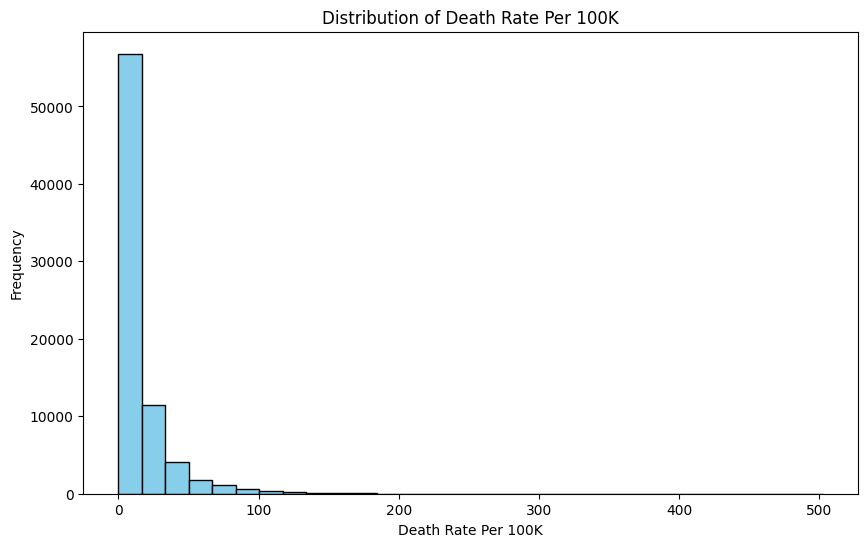

In [166]:
plt.figure(figsize=(10, 6))
plt.hist(train_set['DeathRatePer100K'], bins=30, color='skyblue', edgecolor='black')
plt.xlabel('Death Rate Per 100K')
plt.ylabel('Frequency')
plt.title('Distribution of Death Rate Per 100K')
plt.show()

*************************************************

## **Mini EDA**

I check the correlation of dataframe features  with a heatmap 

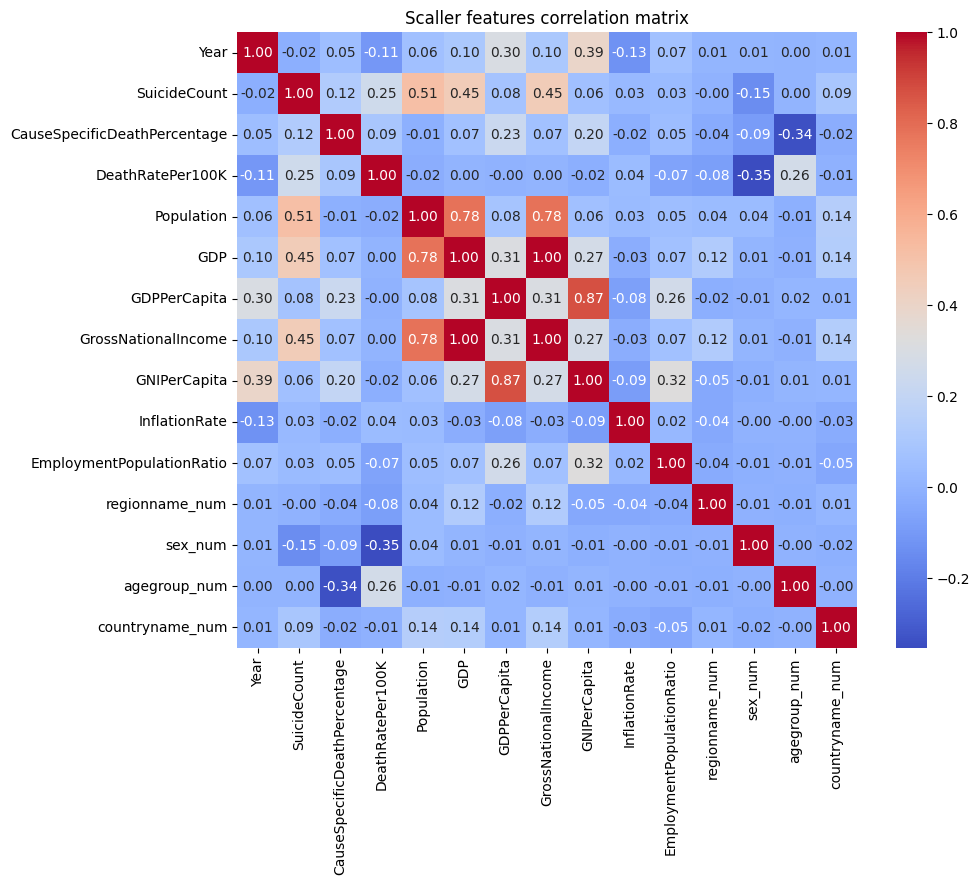

In [167]:
# Calculate correlation matrix
corr_matrix = np.corrcoef(train_set, rowvar=False)


plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", xticklabels=df.columns, yticklabels=df.columns)
plt.title("Scaller features correlation matrix")
plt.show()


**I drop GNIPerCapita and GrossNationalIncome  because they have high correlationship with GDP and GDPperCapita.**

In [228]:

columns_to_drop = ["GNIPerCapita", "GrossNationalIncome"]
train_set.drop(columns_to_drop, inplace = True, axis = 1 )
test_set.drop(columns_to_drop, inplace=True, axis=1)
train_set.info()

<class 'pandas.core.frame.DataFrame'>
Index: 76780 entries, 63667 to 20495
Data columns (total 13 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Year                          76780 non-null  int64  
 1   SuicideCount                  76780 non-null  float64
 2   CauseSpecificDeathPercentage  76780 non-null  float64
 3   DeathRatePer100K              76780 non-null  float64
 4   Population                    76780 non-null  float64
 5   GDP                           76780 non-null  float64
 6   GDPPerCapita                  76780 non-null  float64
 7   InflationRate                 76780 non-null  float64
 8   EmploymentPopulationRatio     76780 non-null  float64
 9   regionname_num                76780 non-null  float64
 10  sex_num                       76780 non-null  int64  
 11  agegroup_num                  76780 non-null  int64  
 12  countryname_num               76780 non-null  int64  
dtypes:

#### **Features distribution**



 **Histgrams, KDE and boxplot**

(12, 2)


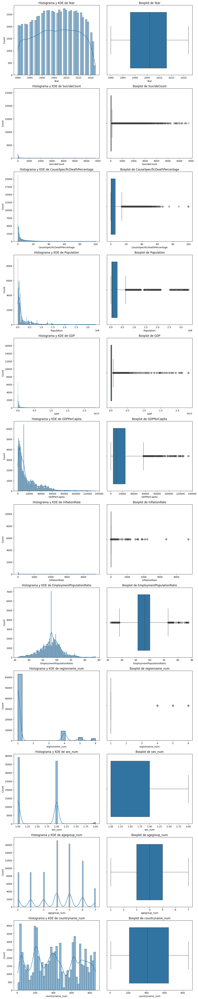

In [169]:
bt.plot_combined_graphs(train_set, [col for col in train_set.columns if col != target])

 **Pairplot**

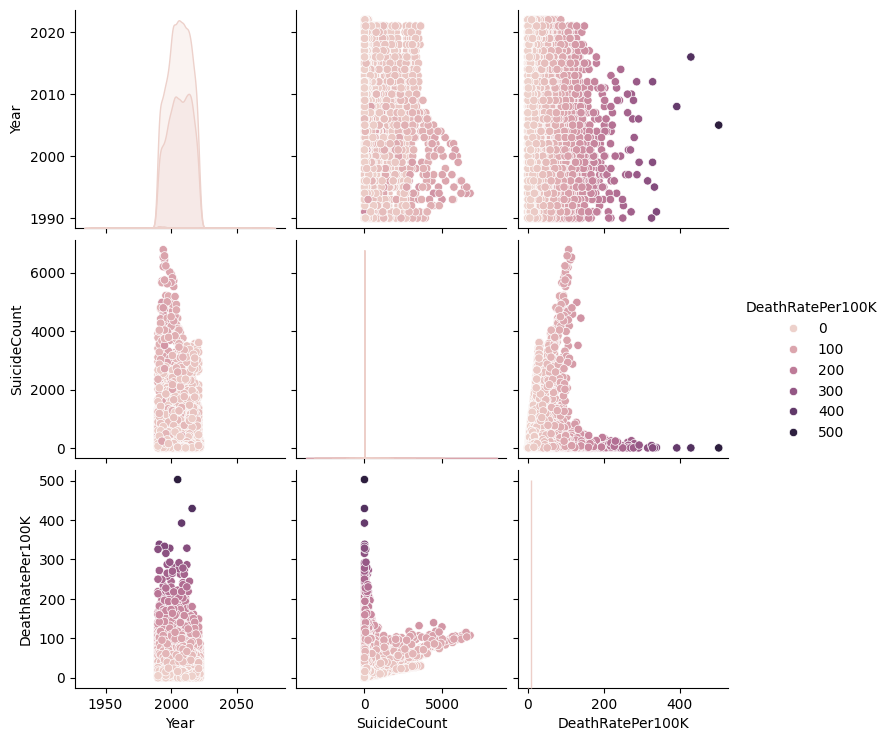

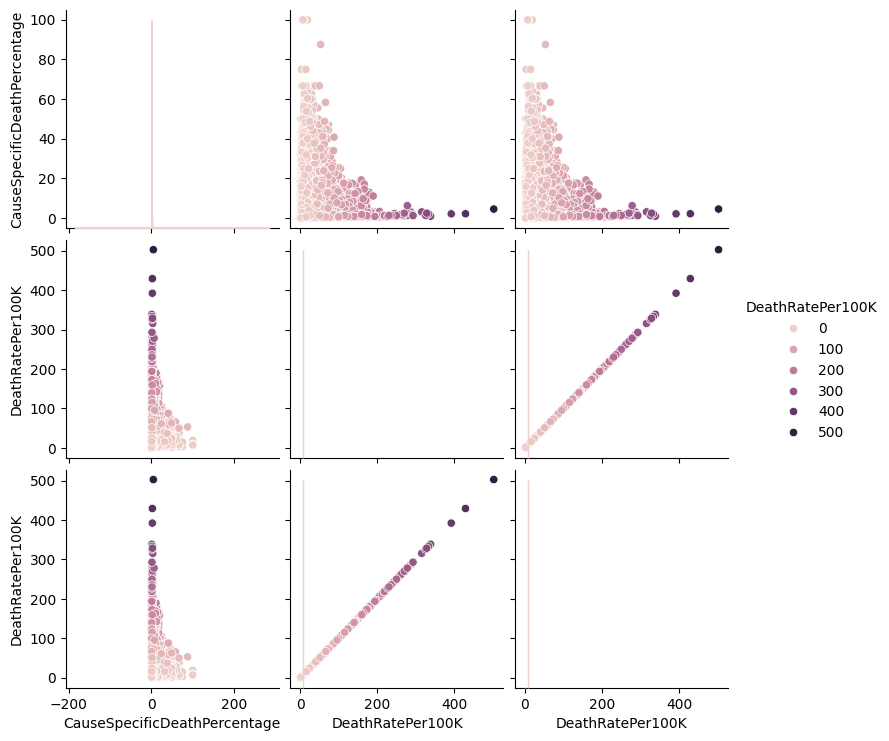

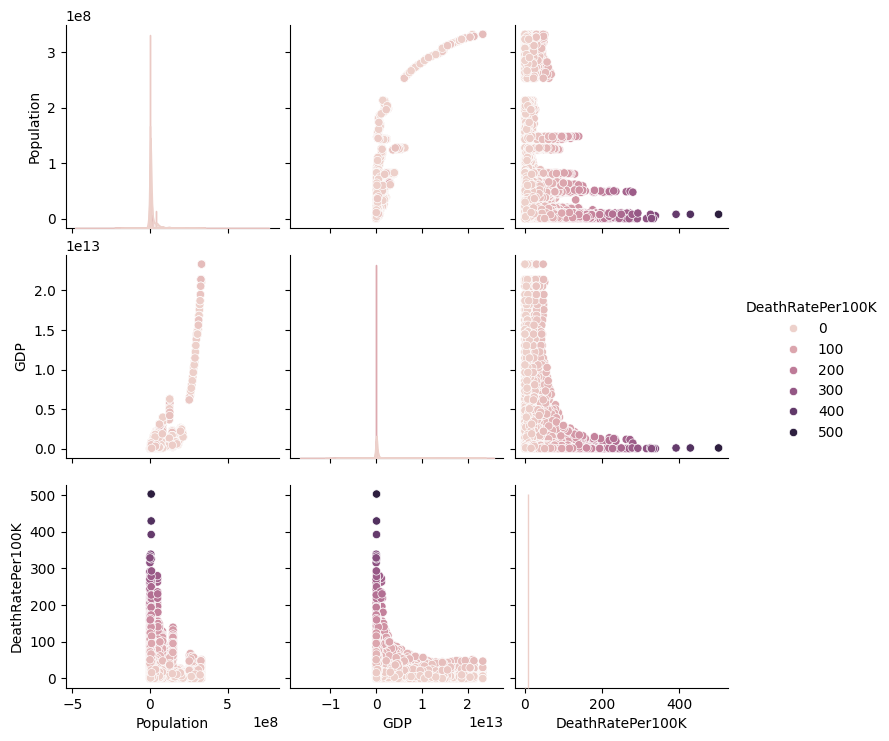

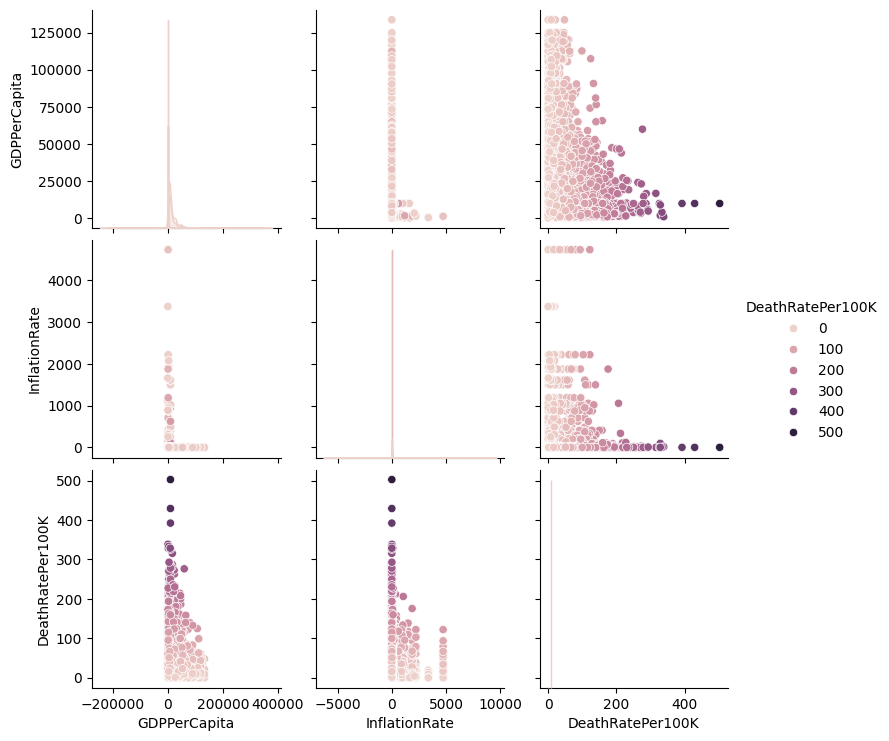

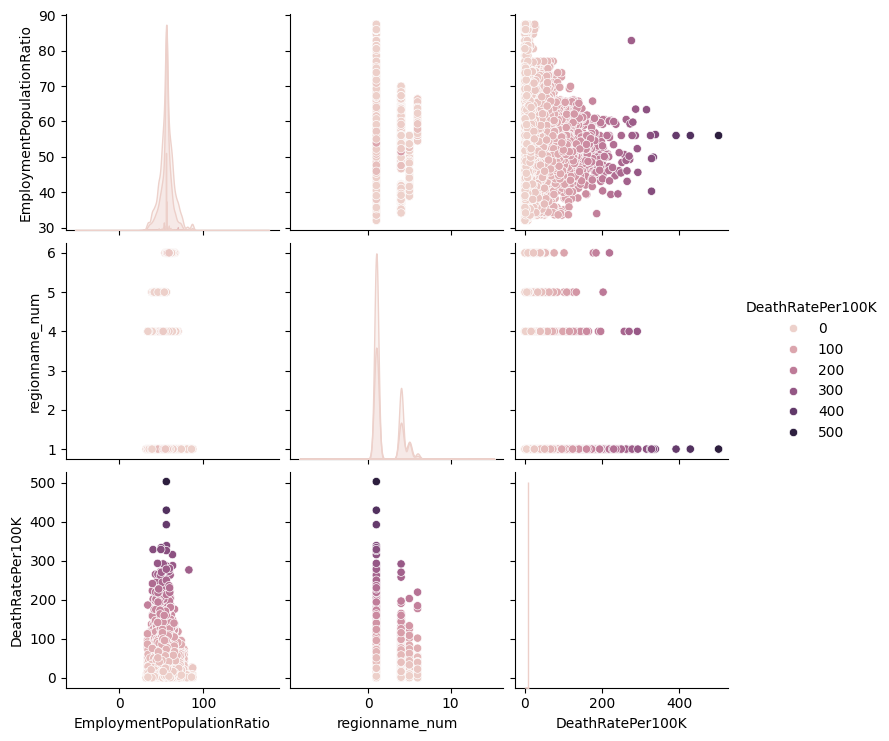

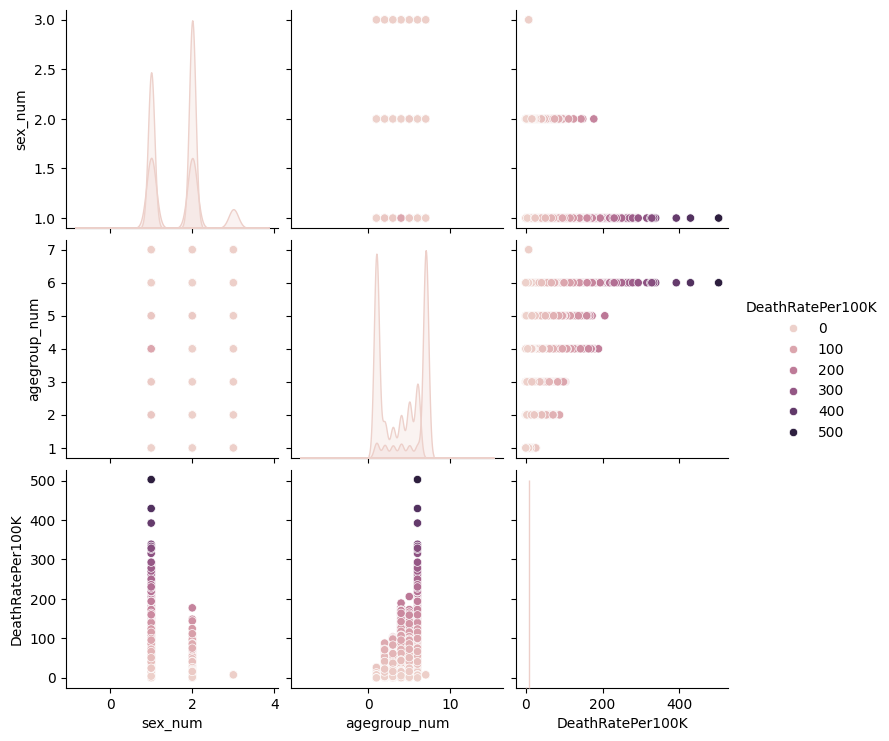

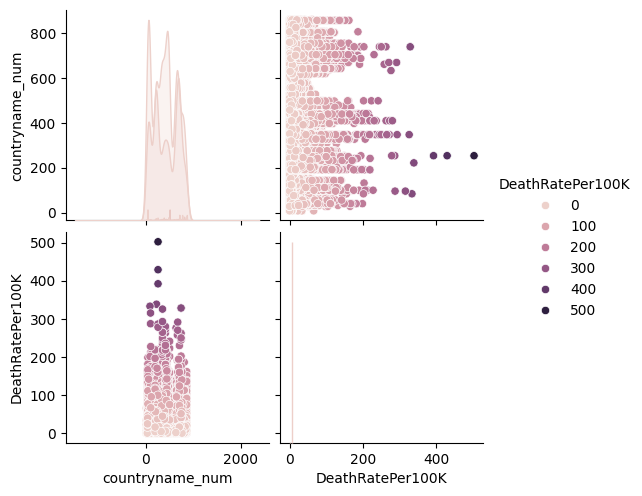

In [170]:
for i in range(0, len(train_set.columns), 2):
    columns_to_plot = train_set.columns[i:i+2].tolist() + ["DeathRatePer100K"]
    sns.pairplot(train_set, vars=columns_to_plot, hue=target)


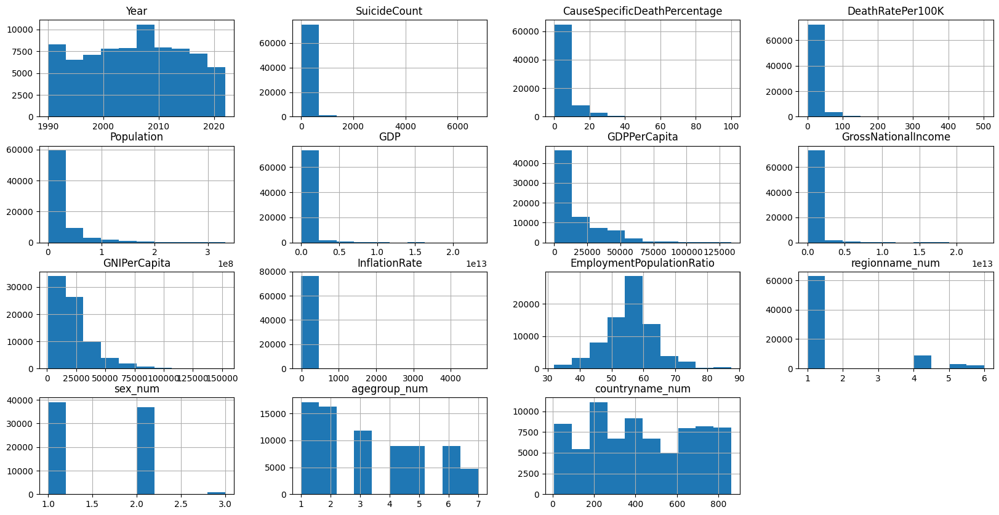

In [28]:
train_set.hist(figsize = (20,10), bins = 10);

The data have very good corelations with the target, and i chose the ones who have good correlation and i drop that ones that i will not need. The best features are Year,EmploymentPopulationRatio, countryname_num, CauseSpecificDeathPercentage, Population, GDP, GDPPerCapita. But, I´m going to use all the features that i didn´t drop, because i need to use all the data that i select to do the best model.

**************************

## Fit models

In [229]:
#This splits a dataset into training data (X_train, y_train) and test data (X_test, y_test) to train and evaluate a machine learning model.

X_train = train_set.drop(target, axis = 1)
y_train = train_set[target]
X_test = test_set.drop(target, axis = 1)
y_test = test_set[target]

In [230]:
X_train.shape

(76780, 12)

### Scall models

In [231]:
scaler = StandardScaler()
X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train), columns= X_train.columns)
X_test_scaled = pd.DataFrame(scaler.transform(X_test), columns= X_test.columns)

Check the correlation heatmap with the scalled model

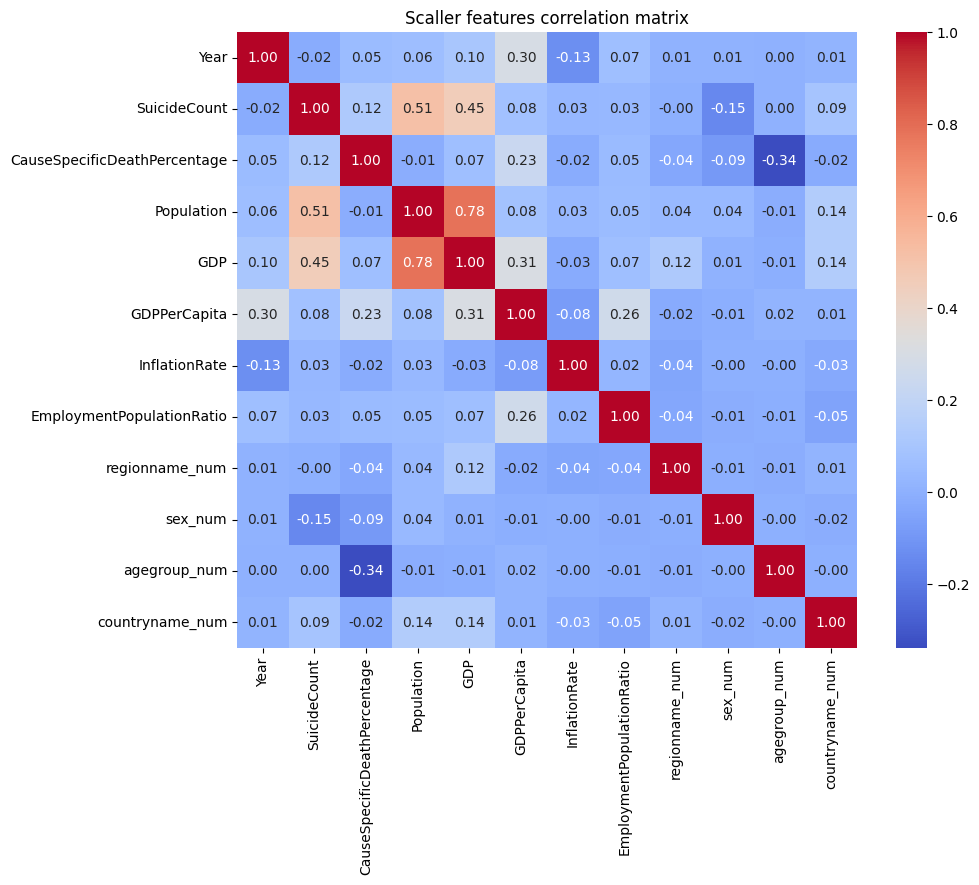

In [232]:
X_train_scaled = scaler.fit_transform(X_train)

# Calculate correlation matrix
corr_matrix = np.corrcoef(X_train_scaled, rowvar=False)

# heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", xticklabels=X_train.columns, yticklabels=X_train.columns)
plt.title("Scaller features correlation matrix")
plt.show()

## **Models**

### I'm looking for the best model so i check the cross validation 

#### Cross validation

performs cross-validation on each model using the training data , and calculates MAE, MSE, MAPE and R² score for each model. 

In [233]:

X = X_train  
y = y_train  

models = {
    'Ridge': Ridge(),
    'XGBoost': XGBRegressor(),
    'LightGBM': LGBMRegressor(verbose=-100),
    'Linear Regression': LinearRegression(),
    'Decision Tree Regressor': DecisionTreeRegressor(),
    'Random Forest': RandomForestRegressor(),
}

# Dictionary to store scores
scores_dict = {}

for name, model in models.items():
    
    # Cross-validation for MAE, MAPE, R2 AND MSE
    mae_scores = cross_val_score(model, X, y, cv=5, scoring='neg_mean_absolute_error')
    mae_mean = np.mean(-mae_scores)
    
    
    mse_scores = cross_val_score(model, X, y, cv=5, scoring='neg_mean_squared_error')
    mse_mean = np.mean(-mse_scores)

   
    r2_scores = cross_val_score(model, X, y, cv=5, scoring='r2')
    r2_mean = np.mean(r2_scores)
    

    
 # show results   
    scores_dict[name] = {'MAE': mae_mean, 'MSE': mse_mean, 'R2': r2_mean}

for name, scores in scores_dict.items():
    print(f'{name}: MAE = {scores["MAE"]:.4f}, MSE = {scores["MSE"]:.4f}, R2 = {scores["R2"]:.4f}')
    print("*********************************************************************************************")

# Find the model with the best average score for each metric
best_model_mae = min(scores_dict, key=lambda x: scores_dict[x]['MAE'])
best_model_mse = min(scores_dict, key=lambda x: scores_dict[x]['MSE'])
best_model_r2 = max(scores_dict, key=lambda x: scores_dict[x]['R2'])



print(f'Best Model for MAE: {best_model_mae}, Score: {scores_dict[best_model_mae]["MAE"]:.4f}')
print(f'Best Model for MSE: {best_model_mse}, Score: {scores_dict[best_model_mse]["MSE"]:.4f}')
print(f'Best Model for R2: {best_model_r2}, Score: {scores_dict[best_model_r2]["R2"]:.4f}')


c:\Users\enrik\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=8.71769e-26): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
c:\Users\enrik\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=8.50313e-26): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
c:\Users\enrik\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=8.63425e-26): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
c:\Users\enrik\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=8.8254e-26): result may not be accurate.
  return linalg.solve(

Ridge: MAE = 10.5630, MSE = 330.9514, R2 = 0.2888
*********************************************************************************************
XGBoost: MAE = 3.2084, MSE = 57.7280, R2 = 0.8759
*********************************************************************************************
LightGBM: MAE = 3.4496, MSE = 61.1026, R2 = 0.8687
*********************************************************************************************
Linear Regression: MAE = 10.5631, MSE = 330.9514, R2 = 0.2888
*********************************************************************************************
Decision Tree Regressor: MAE = 3.1087, MSE = 95.1237, R2 = 0.7990
*********************************************************************************************
Random Forest: MAE = 2.3979, MSE = 51.1327, R2 = 0.8897
*********************************************************************************************
Best Model for MAE: Random Forest, Score: 2.3979
Best Model for MSE: Random Forest, Score: 51.1327
Be

## **Model validation**

I use the best models that had better metrics in the last cell

### Random Forest

Model

In [234]:
rf_reg = RandomForestRegressor()

Fit model

In [236]:
rf_reg.fit(X_train, y_train)

RandomForestRegressor()

Predict

In [237]:
rf_pred = rf_reg.predict(X_test)   

Results

In [238]:
mse_rf = mean_squared_error(y_test, rf_pred)
r2_rf = r2_score(y_test, rf_pred)
mae_rf = mean_absolute_error(y_test, rf_pred)




print("MSE Random Forest Regressor:", mse_rf)
print("****************************************************************")
print("R² Forest Regressor:", r2_rf)
print("****************************************************************")
print("MAE Forest Regressor:", mae_rf)


MSE Random Forest Regressor: 55.9965764053855
****************************************************************
R² Forest Regressor: 0.8752618723325105
****************************************************************
MAE Forest Regressor: 2.3627301731921078


Results

#### Hyperparameters

I do hyperparameters to improve metrics

In [ ]:
rf_params = {
    'n_estimators': [50, 100, 150],  
    'max_depth': [None, 5, 10],  
    'min_samples_split': [2, 3, 5], 
    'min_samples_leaf': [1, 2, 3, 5],  
    'max_features': ['auto', 'sqrt', int(len(X_train.columns)/2)],  
}
# GridSearchCV for Random Forest
rf_grid = GridSearchCV(RandomForestRegressor(), rf_params, cv=5)


rf_grid.fit(X_train_scaled, y_train)


print("Best hyperparams for Random Forest:", rf_grid.best_params_)

Best params

In [239]:
best_rf_model = RandomForestRegressor(bootstrap=True, max_depth=None, max_features='sqrt', min_samples_leaf=1, min_samples_split=2, n_estimators=150)


best_rf_model.fit(X_train, y_train)

RandomForestRegressor(max_features='sqrt', n_estimators=150)

In [240]:
best_rf_pred = best_rf_model.predict(X_test)   

Results

In [241]:
mse_rf_best = mean_squared_error(y_test, best_rf_pred)
r2_rf_best = r2_score(y_test, best_rf_pred)
mae_rf_best = mean_absolute_error(y_test, best_rf_pred)




print("MSE Random Forest Regressor:", mse_rf)
print("MSE Random Forest Regressor best params:", mse_rf_best)
print("****************************************************************")
print("R² Forest Regressor:", r2_rf)
print("R² Forest Regressor best params:", r2_rf_best)
print("****************************************************************")
print("MAE Forest Regressor:", mae_rf)
print("MAE Forest Regressor best params:", mae_rf_best)

#We can compare with and without grid

MSE Random Forest Regressor: 55.9965764053855
MSE Random Forest Regressor best params: 52.70634036261771
****************************************************************
R² Forest Regressor: 0.8752618723325105
R² Forest Regressor best params: 0.8825912111940105
****************************************************************
MAE Forest Regressor: 2.3627301731921078
MAE Forest Regressor best params: 2.551439270077633


I do  a comparation with the best params

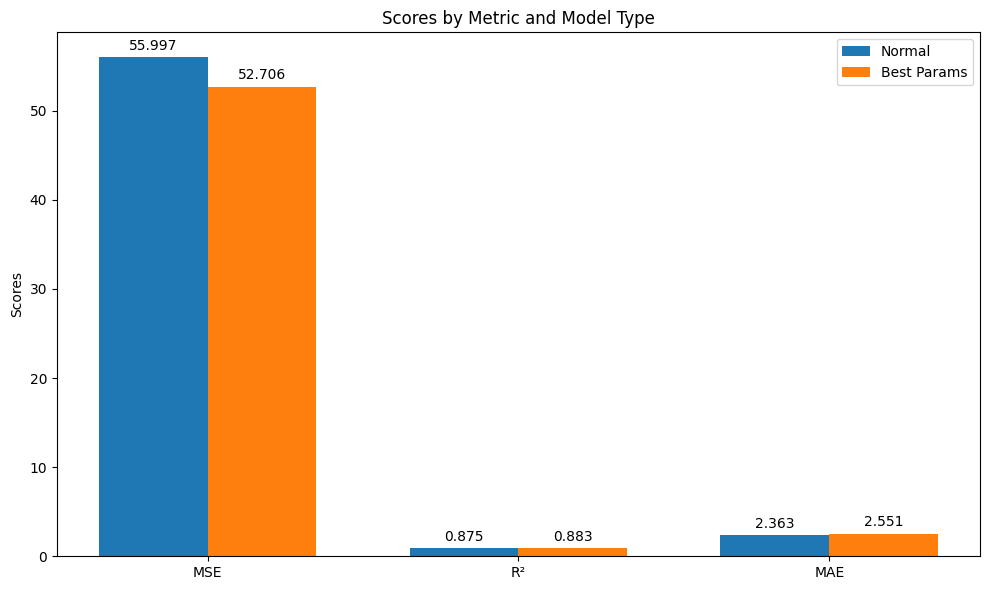

In [242]:


# Defining the results
metrics = ['MSE', 'R²', 'MAE']
normal_results = [round(mse_rf, 3), round(r2_rf, 3), round(mae_rf, 3)]
best_results = [round(mse_rf_best, 3), round(r2_rf_best, 3), round(mae_rf_best, 3)]

# Configuring the plot
x = np.arange(len(metrics))  
width = 0.35  

fig, ax = plt.subplots(figsize=(10, 6))

# Bars for normal results
rects1 = ax.bar(x - width/2, normal_results, width, label='Normal')
# Bars for results with best parameters
rects2 = ax.bar(x + width/2, best_results, width, label='Best Params')

# Labels and title
ax.set_ylabel('Scores')
ax.set_title('Scores by Metric and Model Type')
ax.set_xticks(x)
ax.set_xticklabels(metrics)
ax.legend()

# Function to add labels to the bars
def autolabel(rects):
    """Attach a text label above each bar."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  
                    textcoords="offset points",
                    ha='center', va='bottom')


autolabel(rects1)
autolabel(rects2)

fig.tight_layout()

plt.show()



Save model

In [ ]:
# random forest models
joblib.dump(best_rf_model, 'best_rf_model.pkl')

['best_rf_model.pkl']

********************************************************************

### **LGBM and XGBR regressor**

I check this models because had good results when i did the cross validation

Model

In [243]:

lgbm_model = LGBMRegressor()


xgb_model = XGBRegressor()

Fit LGBM

In [244]:
lgbm_model.fit(X_train, y_train)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001078 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1954
[LightGBM] [Info] Number of data points in the train set: 76780, number of used features: 12
[LightGBM] [Info] Start training from score 14.469075


LGBMRegressor()

Predict LGBM

In [245]:
lgbm_pred= lgbm_model.predict(X_test)

Fit XGB

In [246]:
xgb_model.fit(X_train, y_train)
  

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

Predict XGB

In [247]:
xgb_pred = xgb_model.predict(X_test)

Results

In [248]:

mse_lgbm = mean_squared_error(y_test,lgbm_pred)
mse_xgb = mean_squared_error(y_test, xgb_pred)
r2_lgbm = r2_score(y_test, lgbm_pred)
r2_xgb = r2_score(y_test, xgb_pred)
mae_lgbm = mean_absolute_error(y_test, lgbm_pred)
mae_xgb = mean_absolute_error(y_test, xgb_pred)



print("MSE Lgbm:", mse_lgbm)
print("MSE Xgb:", mse_xgb)

print("****************************************************************")
print("R² Lgbm:", r2_lgbm)
print("R² Xgb:", r2_xgb)

print("****************************************************************")
print("MAE Lgbm:", mae_lgbm)
print("MAE Xgb:", mae_xgb)




MSE Lgbm: 62.43465393765773
MSE Xgb: 56.60588954949956
****************************************************************
R² Lgbm: 0.8609203931081391
R² Xgb: 0.873904564696241
****************************************************************
MAE Lgbm: 3.47861668467011
MAE Xgb: 3.1647036263072628


### Hyperparameters

LGBM parameters

In [ ]:
lgbm_params = {
    'n_estimators': [100, 200, 300],  
    'learning_rate': [0.01, 0.05, 0.1], 
    'max_depth': [-1, 5, 10, 15], 
    'min_child_samples': [0.001, 10, 20, 30], 
    'subsample': [0.8, 0.9, 1.0],  
    'colsample_bytree': [0.8, 0.9, 1.0],
}
lgbm_grid = GridSearchCV(LGBMRegressor(), lgbm_params, cv=5)


lgbm_grid.fit(X_train_scaled, y_train)


print("Best hyperparameters for lgbm:", lgbm_grid.best_params_)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002026 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1954
[LightGBM] [Info] Number of data points in the train set: 61424, number of used features: 12
[LightGBM] [Info] Start training from score 14.540270
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002073 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1954
[LightGBM] [Info] Number of data points in the train set: 61424, number of used features: 12
[LightGBM] [Info] Start training from score 14.445456
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1954
[LightGBM] [Info] Number of data points in the train set: 61424, number of used features: 12
[LightGBM] [Info] Start t

c:\Users\enrik\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\model_selection\_validation.py:547: FitFailedWarning: 
1620 fits failed out of a total of 6480.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1620 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\enrik\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\model_selection\_validation.py", line 895, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\enrik\AppData\Local\Programs\Python\Python310\lib\site-packages\lightgbm\sklearn.py", line 1092, in fit
    super().fit(
  File "c:\Users\enrik\AppData\Local\Programs\Python\Python310\lib\site-packages\lightgbm\sklearn.py", lin

Best hyperparameters for lgbm: {'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 15, 'min_child_samples': 10, 'n_estimators': 300, 'subsample': 0.8}


 Fit model with best hyperparameters

In [249]:
best_lgbm_model = LGBMRegressor(colsample_bytree = 1.0, learning_rate = 0.1, max_depth = 15, min_child_samples = 10, n_estimators = 300, subsample = 0.8 )

best_lgbm_model.fit(X_train, y_train)

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000938 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1954
[LightGBM] [Info] Number of data points in the train set: 76780, number of used features: 12
[LightGBM] [Info] Start training from score 14.469075


LGBMRegressor(max_depth=15, min_child_samples=10, n_estimators=300,
              subsample=0.8)

Predict

In [250]:
best_lgbm_pred = best_lgbm_model.predict(X_test) 

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


In [251]:

mse_lgbm_best = mean_squared_error(y_test, best_lgbm_pred)
r2_lgbm_best = r2_score(y_test, best_lgbm_pred)
mae_lgbm_best = mean_absolute_error(y_test, best_lgbm_pred)






Hyperparameters XGB

In [ ]:
xgb_params = {
    'n_estimators': [100, 150], 
    'learning_rate': [0.05, 0.1],  
    'max_depth': [6, 10], 
    'min_child_weight': [1, 5],  
    'subsample': [0.9, 1.0],  
    'colsample_bytree': [0.9, 1.0], 
}
xgb_grid = GridSearchCV(XGBRegressor(), xgb_params, cv=5)

xgb_grid.fit(X_train_scaled, y_train)


print("Best hyperparameters for xgb:", xgb_grid.best_params_)

In [252]:
best_xgb_model = LGBMRegressor(colsample_bytree= 0.9, learning_rate = 0.1, max_depth = 10, min_child_weight = 5, n_estimators = 150, subsample = 0.9)

best_xgb_model.fit(X_train, y_train)

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000867 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1954
[LightGBM] [Info] Number of data points in the train set: 76780, number of used features: 12
[LightGBM] [Info] Start training from score 14.469075


LGBMRegressor(colsample_bytree=0.9, max_depth=10, min_child_weight=5,
              n_estimators=150, subsample=0.9)

In [253]:
best_xgb_pred = best_xgb_model.predict(X_test)

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


In [255]:
mse_xgb_best = mean_squared_error(y_test, best_xgb_pred)
r2_xgb_best = r2_score(y_test, best_lgbm_pred)
mae_xgb_best = mean_absolute_error(y_test, best_xgb_pred)


### Compare our best models


In [256]:

print("MSE lgbm best params:", mse_lgbm_best)
print("MSE xgb best params:", mse_xgb_best)
print("MSE Random Forest Regressor best params:", mse_rf_best)
print("****************************************************************")
print("R² lgbm best params:", r2_lgbm_best)
print("R² xgb best params:", r2_xgb_best)
print("R² Random Forest Regressor best params:", r2_rf_best)
print("****************************************************************")
print("MAE lgbm best params:", mae_lgbm_best)
print("MAE xgb best params:", mae_xgb_best) 
print("MAE Random Forest Regressor best params:", mae_rf_best)




MSE lgbm best params: 52.83419532549725
MSE xgb best params: 57.696188175781955
MSE Random Forest Regressor best params: 52.70634036261771
****************************************************************
R² lgbm best params: 0.8823064011269247
R² xgb best params: 0.8823064011269247
R² Random Forest Regressor best params: 0.8825912111940105
****************************************************************
MAE lgbm best params: 2.9206735767188206
MAE xgb best params: 3.265506999588615
MAE Random Forest Regressor best params: 2.551439270077633


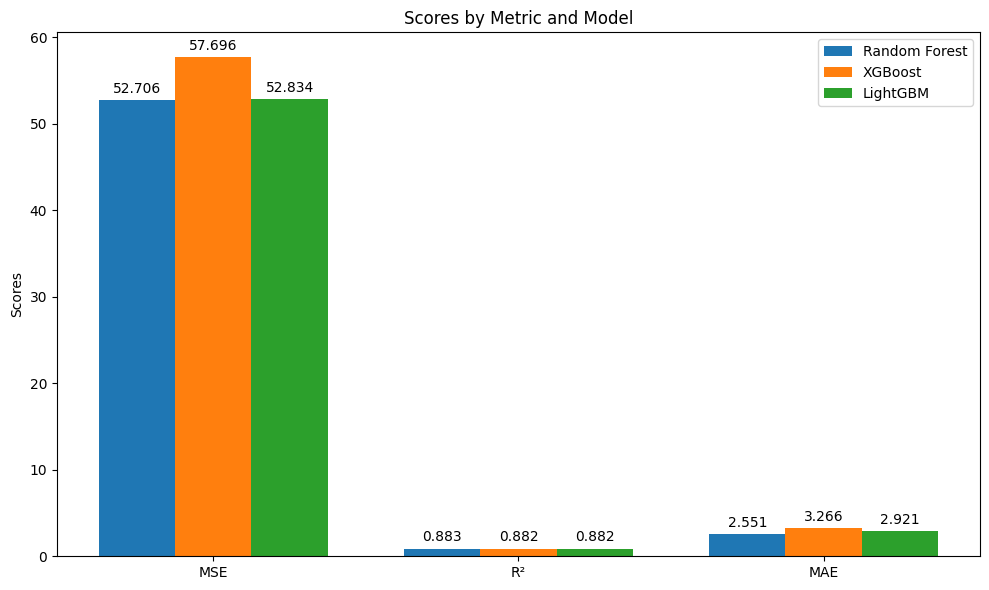

In [257]:

# Define the metrics and their corresponding values
metrics = ['MSE', 'R²', 'MAE']
rf_values = [round(mse_rf_best, 3), round(r2_rf_best, 3), round(mae_rf_best, 3)]
xgb_values = [round(mse_xgb_best, 3), round(r2_xgb_best, 3), round(mae_xgb_best, 3)]
lgbm_values = [round(mse_lgbm_best, 3), round(r2_lgbm_best, 3), round(mae_lgbm_best, 3)]

# Configure the plot
x = np.arange(len(metrics))  
width = 0.25

fig, ax = plt.subplots(figsize=(10, 6))

# Bars for:
rects1 = ax.bar(x - width, rf_values, width, label='Random Forest')

rects2 = ax.bar(x, xgb_values, width, label='XGBoost')

rects3 = ax.bar(x + width, lgbm_values, width, label='LightGBM')

ax.set_ylabel('Scores')
ax.set_title('Scores by Metric and Model')
ax.set_xticks(x)
ax.set_xticklabels(metrics)
ax.legend()

# Function to add labels to the bars
def autolabel(rects):
    """Attach a text label above each bar."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  
                    textcoords="offset points",
                    ha='center', va='bottom')


autolabel(rects1)
autolabel(rects2)
autolabel(rects3)

fig.tight_layout()

plt.show()






### Conclusions

Based on the provided metrics for Mean Squared Error (MSE), Coefficient of Determination (R²), and Mean Absolute Error (MAE) of LightGBM (lgbm), XGBoost (xgb), and Random Forest Regressor models, I can draw some conclusions:

1. **MSE (Mean Squared Error):**
   - The best performance is observed in the Random Forest Regressor model, with an MSE of approximately 52.71.
   - LGBM and XGBoost have slightly higher MSEs, with values close to 52.83 and 57.70, respectively.

2. **R² (Coefficient of Determination):**
   - LGBM and XGBoost show the same R², approximately 0.8823.
   - The Random Forest Regressor model has a slightly higher R², around 0.8826.

3. **MAE (Mean Absolute Error):**
   - The model with the lowest MAE is the Random Forest Regressor, with a value of approximately 2.55.
   - LGBM has an MAE close to 2.92, while XGBoost has the highest MAE of approximately 3.27.

In summary, based on these metrics, the Random Forest Regressor model appears to be the best choice, as it has slightly better performance in terms of MSE, R², and MAE compared to the other two models (LGBM and XGBoost). However, the differences are quite small, so other factors such as model interpretability or training speed could also influence the final model choice.


In [258]:
def plot_predictions_vs_actual(y_real, y_pred):
    """
    Function to plot the actual values vs. the predicted values in a regression.

    Args:
    y_real (array-like): Real values of the target variable.
    y_pred (array-like): Predicted values of the target variable.
    """
    plt.figure(figsize=(8, 6))
    plt.scatter(y_pred, y_real, alpha=0.5)
    plt.xlabel("Predicted Values")
    plt.ylabel("Actual Values")

    # Line y=x
    max_value = max(max(y_real), max(y_pred))
    min_value = min(min(y_real), min(y_pred))
    plt.plot([min_value, max_value], [min_value, max_value], 'r')

    plt.title("Comparison of Actual vs. Predicted Values")
    plt.show()

dispersion

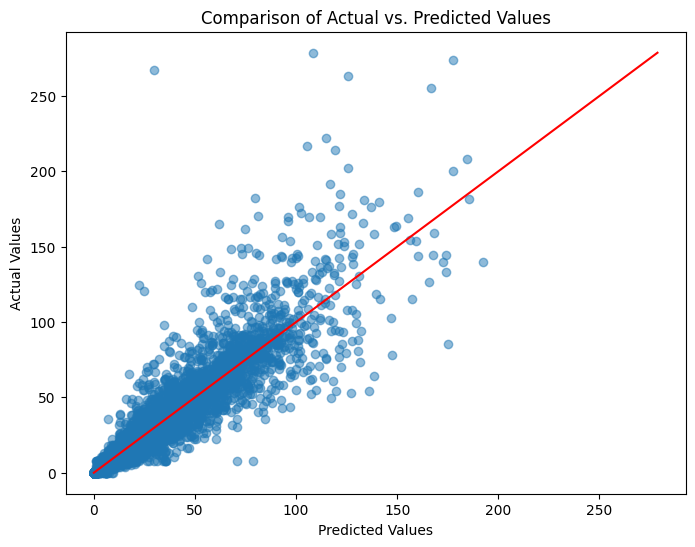

In [259]:
plot_predictions_vs_actual(y_test, best_rf_pred)

**Save models**

In [ ]:

joblib.dump(best_xgb_model, 'best_xgb_model.pkl')
joblib.dump(best_lgbm_model, 'best_lgbm_model.pkl')


['best_lgbm_model.pkl']

**Load models**

In [235]:
loaded_model = joblib.load('best_lgb_model.pkl')
loaded_model = joblib.load('best_xgb_model.pkl')
loaded_model = joblib.load('best_rf_model.pkl')

****************************************************************

# Identify whether the most important risk factors associated with high suicide rates in each country are socioeconomic.

In [260]:
#returns the importance of each feature in the trained model
best_rf_model.feature_importances_


array([0.02828811, 0.18216365, 0.16665441, 0.10092855, 0.05504439,
       0.03690102, 0.02934718, 0.04149734, 0.00711676, 0.12093994,
       0.179156  , 0.05196265])

In [261]:

feature_importances = np.array([0.02821538, 0.1682761 , 0.17322646, 0.09650395, 0.05349051,
                                0.03726566, 0.02900077, 0.04207283, 0.00737584, 0.12453187,
                                0.18761082, 0.05242982])

Order features

In [262]:

sorted_importances = np.sort(feature_importances)[::-1]
print(sorted_importances)

[0.18761082 0.17322646 0.1682761  0.12453187 0.09650395 0.05349051
 0.05242982 0.04207283 0.03726566 0.02900077 0.02821538 0.00737584]


In [263]:
X_train.columns

Index(['Year', 'SuicideCount', 'CauseSpecificDeathPercentage', 'Population',
       'GDP', 'GDPPerCapita', 'InflationRate', 'EmploymentPopulationRatio',
       'regionname_num', 'sex_num', 'agegroup_num', 'countryname_num'],
      dtype='object')

In [264]:
feature_names = ['Year', 'SuicideCount', 'CauseSpecificDeathPercentage', 'Population',
                 'GDP', 'GDPPerCapita', 'InflationRate', 'EmploymentPopulationRatio',
                 'regionname_num', 'sex_num', 'agegroup_num', 'countryname_num']

Order features by importance

In [265]:
sorted_indices = np.argsort(feature_importances)[::-1]
sorted_features = [feature_names[i] for i in sorted_indices]

Represent the results

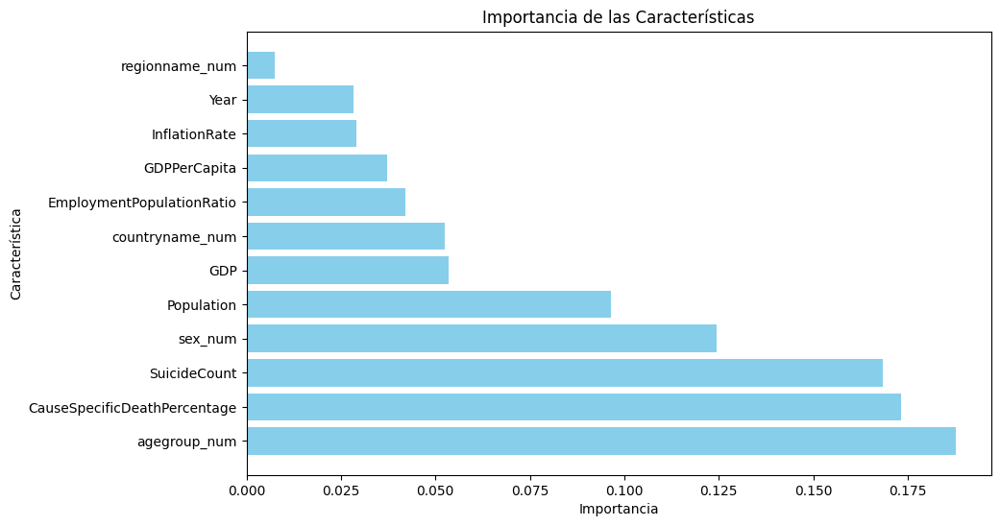

In [266]:

plt.figure(figsize=(10, 6))
plt.barh(sorted_features, feature_importances[sorted_indices], color='skyblue')
plt.xlabel('Importancia')
plt.ylabel('Característica')
plt.title('Importancia de las Características')
plt.show()

As we can see on the graphic, the economic rates are not the principal cause of suicides, other features are more relevant as age or sex.

**************************************************************************

## Rank countries according to their perceived need for mental health and suicide prevention intervention and resources.

In [267]:
X_train.columns

Index(['Year', 'SuicideCount', 'CauseSpecificDeathPercentage', 'Population',
       'GDP', 'GDPPerCapita', 'InflationRate', 'EmploymentPopulationRatio',
       'regionname_num', 'sex_num', 'agegroup_num', 'countryname_num'],
      dtype='object')

I reverse the dictionary

In [268]:
# Reverse dictionary
inverse_mapping_dict_4 = {v: k for k, v in mapping_dict_4.items()}

# Dataframe
inverse_country = pd.DataFrame(list(inverse_mapping_dict_4.items()), columns=['country_code', 'country_name'])

inverse_country.set_index('country_code', inplace=True)
inverse_country



,country_name
country_code,
8,Albania
32,Argentina
51,Armenia
36,Australia
40,Austria
...,...
422,Lebanon
496,Mongolia
458,Malaysia


Order inverse_country by country_name ascendent.

In [269]:

top_countries= inverse_country.sort_values(by='country_name') 



In [270]:
top_countries

,country_name
country_code,
8,Albania
28,Antigua and Barbuda
32,Argentina
51,Armenia
36,Australia
...,...
826,United Kingdom of Great Britain and Northern I...
840,United States of America
858,Uruguay


In [271]:
# Calculate the total number of deaths per country
country_death_counts = train_unique.groupby('countryname_num')[target].sum()

# Sort the countries by total number of deaths in descending order
country_death_counts_sorted = country_death_counts.sort_values(ascending=False)

top_countries = country_death_counts_sorted.head(30)



Get the names of the countries corresponding to the country codes.

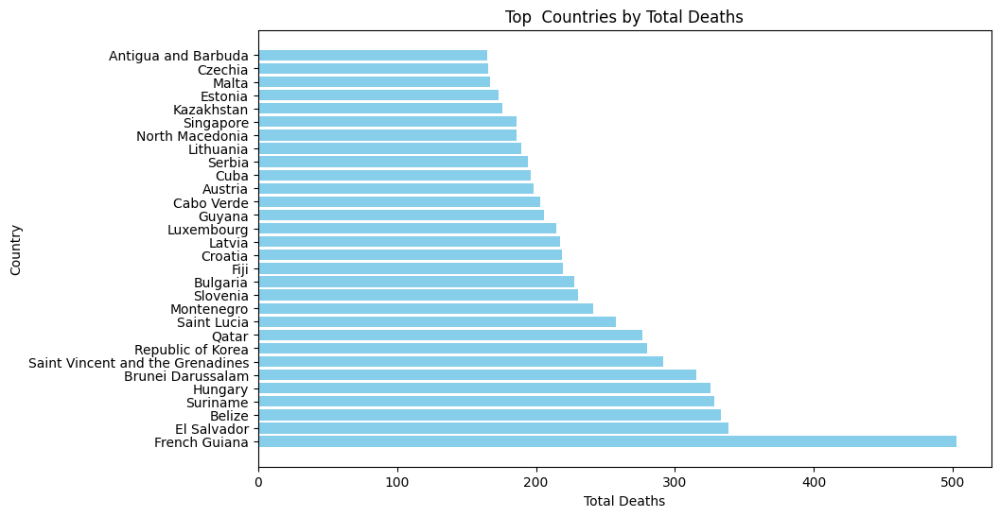

In [272]:
country_names = [inverse_country_unique.loc[code, 'country_name'] for code in top_countries.index]

plt.figure(figsize=(10, 6))
plt.barh(country_names, top_countries.values, color='skyblue') 
plt.xlabel('Total Deaths')
plt.ylabel('Country')
plt.title('Top  Countries by Total Deaths')

plt.show()


I have sorted the countries based on suicide rates so that the WHO knows where to invest more resources.

******************

 Click to [Return](#MACHINE-LEARNING-PROJECT:-OMS-INSIGHTS-INTO-MENTAL-HEALTH-CHALLENGES-IN-THE-POPULATION) to the begginining

************************************************